## Capturing video from mono-camera

In [15]:
import numpy as np
import cv2
import time
import os

cam = cv2.VideoCapture(cv2.CAP_DSHOW)
cam.set(cv2.CAP_PROP_FRAME_WIDTH, 1920)
cam.set(cv2.CAP_PROP_FRAME_HEIGHT, 1080)
i = 0

while(True):
    success, frame = cam.read()
    
    if (success == False):
        print ('Cannot read the frame')
        
        break
    
    key = cv2.waitKey(20) & 0xFF
    
    if (key == ord('q')):
        break
    
    elif (key == 32):
        cv2.imwrite('calib/' + str(i) + '.jpg', frame)
        i += 1
        
    cv2.imshow('frame', frame)
    
    cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
    cv2.imshow('custom window', frame)
    cv2.resizeWindow('custom window', 1280, 720)
    
cam.release()
cv2.destroyAllWindows()
cv2.waitKey(10)


-1

## Recording video from mono-camera

In [32]:
import numpy as np
import cv2
import time
import os

cam = cv2.VideoCapture(cv2.CAP_DSHOW)
# cam.set(cv2.CAP_PROP_FRAME_WIDTH, 1920)
# cam.set(cv2.CAP_PROP_FRAME_HEIGHT, 1080)

success, frame = cam.read()
h, w, _ = frame.shape

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('outpt.avi', fourcc, 30.0, (w, h))

record = False
i = 0

while(True):
    success, frame = cam.read()
    
    if (success == False):
        print ('Cannot read the frame')
        
        break
    
    if (record == True):
        out.write(frame)
        cv2.circle(frame, (50,50), 20, (0, 0, 250), -1)
        
    key = cv2.waitKey(20) & 0xFF
    
    if (key == ord('w')):
        record = not record
    
    if (key == ord('q')):
        break
    
    elif (key == 32):
        if not os.path.exists('calib'):
            os.makedirs('calib')
            
        cv2.imwrite('calib/' + str(i) + '.jpg', frame)
            
        i += 1
        
    cv2.imshow('frame', frame)
    
    # cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
    # cv2.imshow('custom window', frame)
    # cv2.resizeWindow('custom window', 1280, 720)
    
out.release()
cam.release()
cv2.destroyAllWindows()
cv2.waitKey(10)

-1

## Finding corners of chessboard

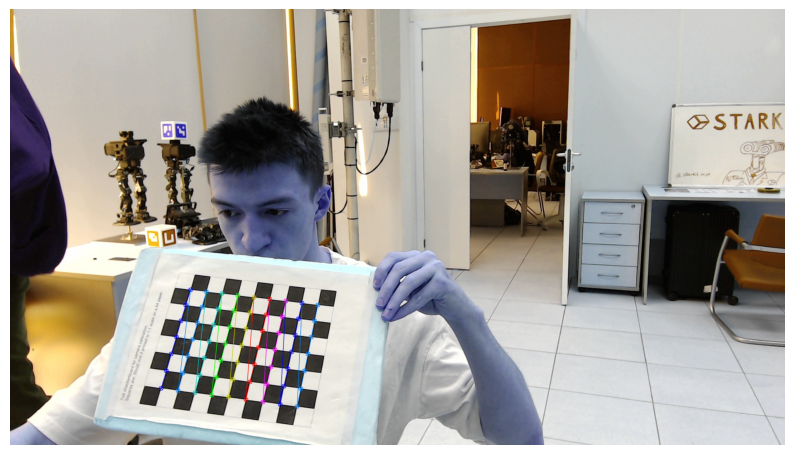

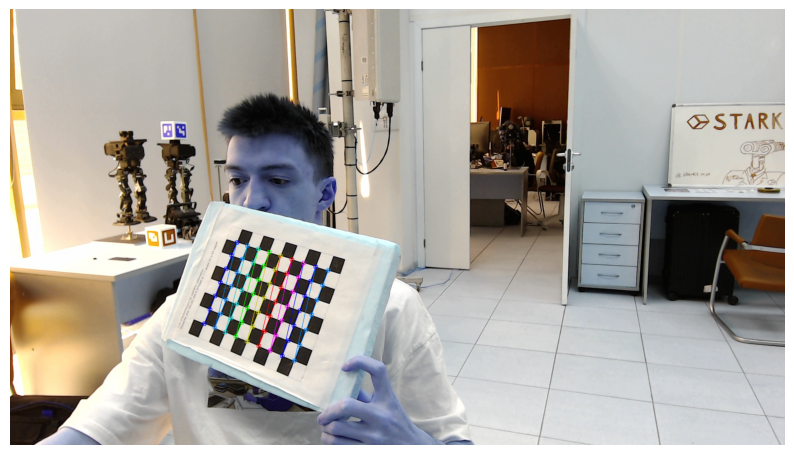

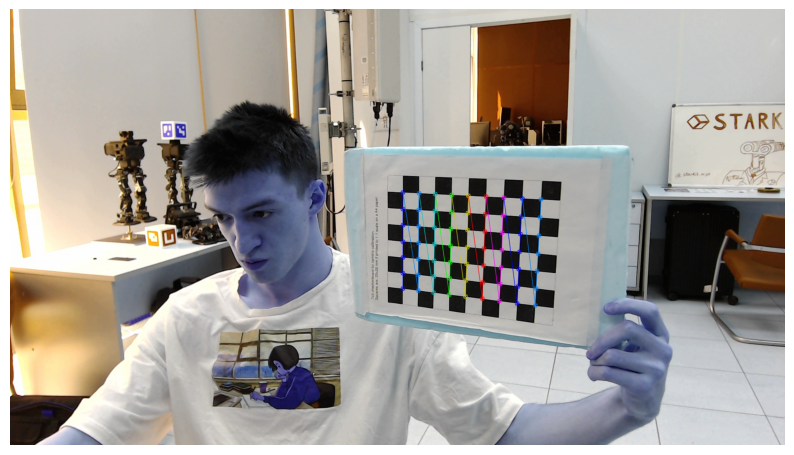

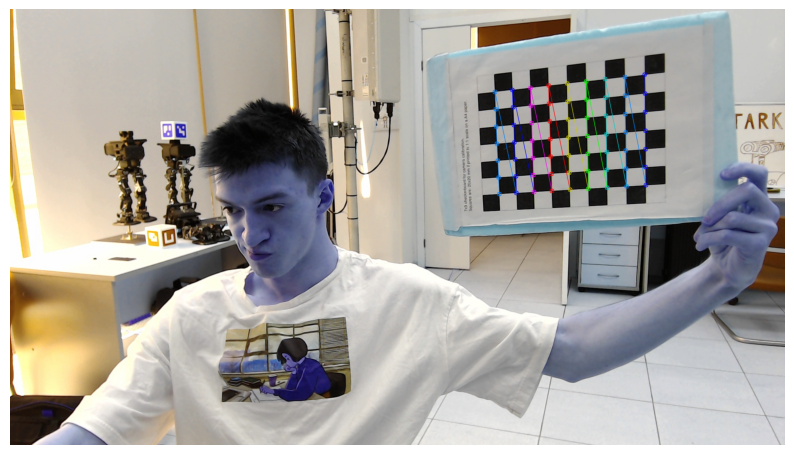

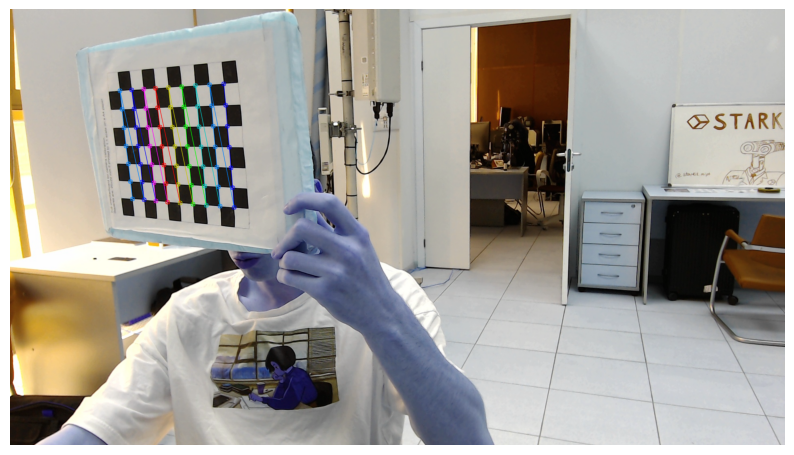

...

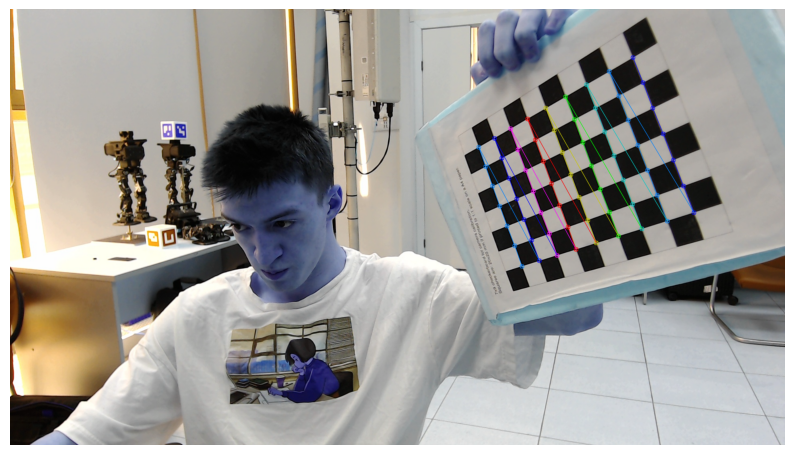

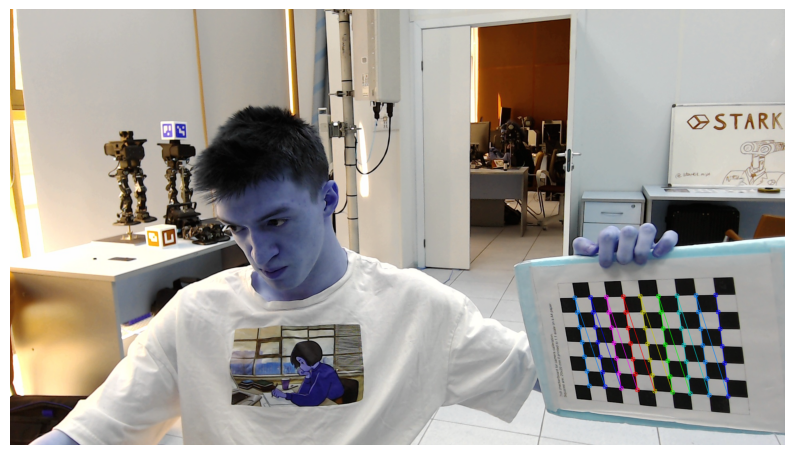

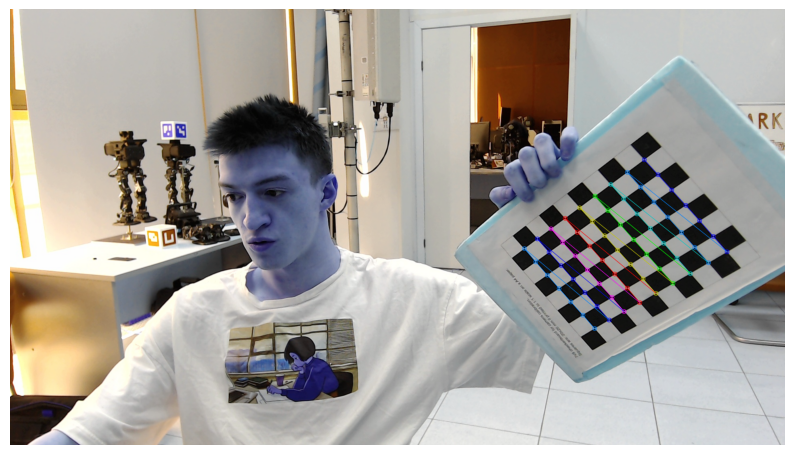

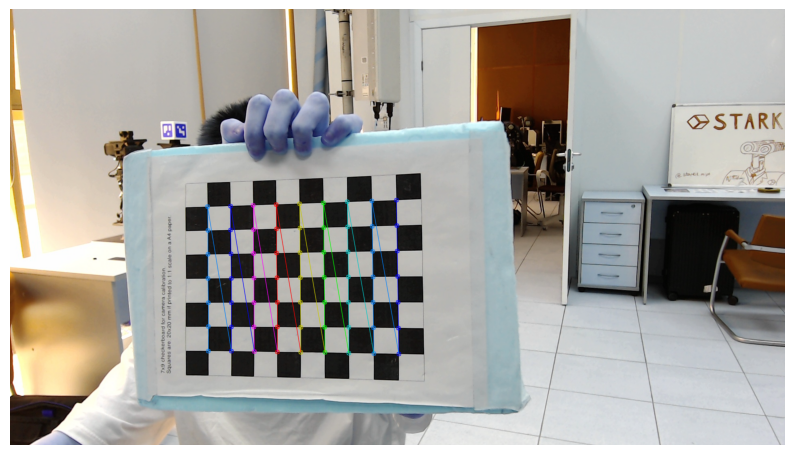

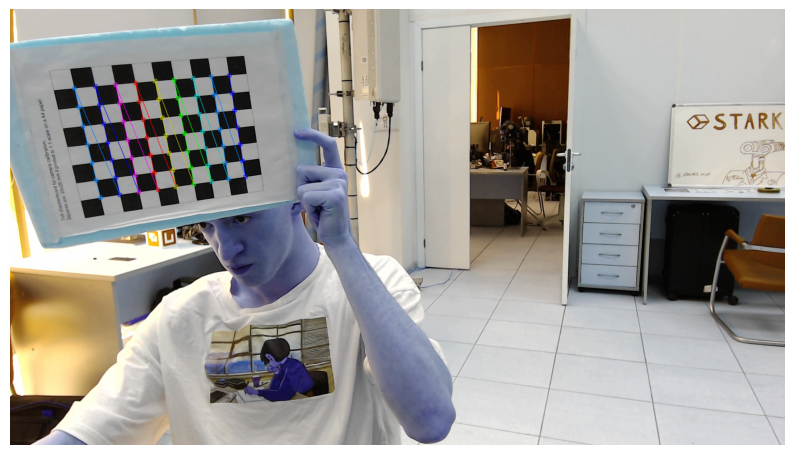

In [36]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10, 10)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TermCriteria_MAX_ITER, 30, 0.001)

# prepare objects points like (0,0,0), (1,0,0), (2,0,0), ... ,(6,5,0)
objp = np.zeros((9 * 7, 3), np.float32)
objp[:, :2] = np.mgrid[0:7, 0:9].T.reshape(-1, 2) * 0.02

# Arrays to store objects points and image from all images
objpoints = [] #coordinates in 3d in real world
imgpoints = [] #coordinates in 2d in image plane

images = glob.glob('calib/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (7, 9), None)
    
    # If found, add objects points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)
        
        corners2 = cv2.cornerSubPix(gray,corners, (11, 11), (-1, -1), criteria)
        imgpoints.append(corners2)
        
        cv2.drawChessboardCorners(img, (7, 9), corners2, ret)

        plt.imshow(img)
        plt.axis('off')
        plt.show()

## Camera callibratoin

In [38]:
import cv2

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, 
                                                   gray.shape[::-1], None, None)

print('ret \n', ret)
print('mtx \n', mtx)
print('dist \n', dist)

print ('rvecs')
for i in range(14):
    print(rvecs[i], end=' ')
    print()
    
print ('tvecs')
for i in range(14):
    print(rvecs[i], end=' ')
    print()

ret 
 0.369048624368947
mtx 
 [[1.41449364e+03 0.00000000e+00 9.35626496e+02]
 [0.00000000e+00 1.40869591e+03 5.97758496e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
dist 
 [[ 0.1230026  -0.24356912  0.00444053 -0.00125263  0.08022022]]
rvecs
[[-0.3547676 ]
 [-0.23637892]
 [-1.41664172]] 
[[-0.51564774]
 [ 0.19626775]
 [-1.23319603]] 
[[-0.14646675]
 [ 0.4998357 ]
 [-1.49444645]] 
[[0.35895598]
 [0.09571158]
 [1.49795398]] 
[[0.6050362 ]
 [0.26031089]
 [1.56336735]] 
[[0.18747147]
 [0.28159078]
 [0.04413847]] 
[[ 0.20064298]
 [ 0.20606844]
 [-1.30781762]] 
[[0.46046696]
 [0.64900566]
 [1.48749726]] 
[[-0.40308207]
 [ 0.79959329]
 [-1.19886645]] 
[[0.72217012]
 [0.61916882]
 [1.11752047]] 
[[0.65018723]
 [0.382544  ]
 [1.35922903]] 
[[0.55369083]
 [0.31938284]
 [0.82052091]] 
[[0.15287831]
 [0.17180058]
 [1.54897493]] 
[[-0.04298472]
 [-0.57220531]
 [ 1.39811361]] 
tvecs
[[-0.3547676 ]
 [-0.23637892]
 [-1.41664172]] 
[[-0.51564774]
 [ 0.19626775]
 [-1.23319603]] 
[[-0.14646675]

Фокусное расстояние светочувствительной матрицы по оси x примерно равно 1414 пикселей, а по оси y - 1409 пикселей. Они различаются, но все равно близки

## Distance to a chesseboard pattern 

In [14]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import math

A = np.array([[1.41449364e+03, 0.00000000e+00, 9.35626496e+02],
              [0.00000000e+00, 1.40869591e+03, 5.97758496e+02],
              [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

dist = np.array([[0.1230026, -0.24356912, 0.00444053, -0.00125263, 0.08022022]])

objp = np.zeros((9 * 7, 3), np.float32)
objp[:, :2] = np.mgrid[0:7, 0:9].T.reshape(-1, 2) * 0.02

# Arrays to store objects points and image from all images
objpoints = [] #coordinates in 3d in real world
imgpoints = [] #coordinates in 2d in image plane

filename = 0

cam = cv2.VideoCapture(cv2.CAP_DSHOW)
cam.set(cv2.CAP_PROP_FRAME_WIDTH, 1920)
cam.set(cv2.CAP_PROP_FRAME_HEIGHT, 1080)

while(True):
    success, frame = cam.read()
    
    if (success == False):
        
        cam.release()
        cam = cv2.VideoCapture(cv2.CAP_DSHOW)
        cam.set(cv2.CAP_PROP_FRAME_WIDTH, 1920)
        cam.set(cv2.CAP_PROP_FRAME_HEIGHT, 1080)
        continue
    
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (7, 9), None)
    
    if (ret == True):
        s, rvec, tvec = cv2.solvePnP(objp, corners, A, dist, flags=0)
        
        if (s == False):
            continue
        
        srvec = 'rvec:' + str(rvec[0][0])[:5] + " " + str(rvec[1][0])[:5] + " " + str(rvec[2][0])[:5] + " "
        image = cv2.putText(frame, srvec, (50, 50), cv2.FONT_HERSHEY_PLAIN, 2, (0, 0, 255), 2, cv2.LINE_AA)
        
        stvec = 'tvec:' + str(tvec[0][0])[:5] + " " + str(tvec[1][0])[:5] + " " + str(tvec[2][0])[:5] + " "
        image = cv2.putText(frame, stvec, (50, 100), cv2.FONT_HERSHEY_PLAIN, 2, (0, 0, 255), 2, cv2.LINE_AA)
    
    #Сonverting vectors to board rotation angles
        Rt = cv2.Rodrigues(rvec)
        Rt = np.transpose(Rt[0])
        sy = math.sqrt(Rt[0, 0] * Rt[0, 0] + Rt[1, 0] * Rt[1, 0])
        singular = sy < 1e-6

        # rotation matrix to Euler Angles
        if not singular:
            x = math.atan2(Rt[2,1] , Rt[2,2])* (180 / np.pi)
            y = math.atan2(-Rt[2,0], sy)* (180 / np.pi)
            z = math.atan2(Rt[1,0], Rt[0,0])* (180 / np.pi)

        else:
            x = math.atan2(-Rt[1,2], Rt[1,1])* (180 / np.pi)
            y = math.atan2(-Rt[2,0], sy)* (180 / np.pi)
            z = 0

        image = cv2.putText(frame, str(x)[:5] + " " +
                                   str(y)[:5] + " " +
                                   str(z)[:5], (50, 150), cv2.FONT_HERSHEY_PLAIN, 2, (0, 0, 255), 2, cv2.LINE_AA)
    cv2.imshow('frame', frame)
    
    cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
    cv2.imshow('custom window', frame)
    cv2.resizeWindow('custom window', 1280, 720)
    
    
    key = cv2.waitKey(120) & 0xFF
    
    if (key == ord('q')):
        break

cam.release()
cv2.destroyAllWindows()
cv2.waitKey(10)

-1

![alt text](<custom window.png>)

## Distance to a an object of known size

In [2]:
import cv2
import numpy as np

cam = cv2.VideoCapture(cv2.CAP_DSHOW)

d0 = 1.21
h0 = 52

while (True):
    success, frame = cam.read()
    
    blurred = cv2.blur(frame, (7, 7))
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (0, 205, 58), (201, 243, 106))
    
    cv2.imshow('mask', mask)
    
    connectivity = 4  
    output = cv2.connectedComponentsWithStats(mask, connectivity, cv2.CV_32S)
    
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    
    obj_h = 0.0000001
    
    for i in range(1, num_labels):
        a = stats[i, cv2.CC_STAT_AREA]
        top = stats[i, cv2.CC_STAT_TOP]
        left = stats[i, cv2.CC_STAT_LEFT]
        width = stats[i, cv2.CC_STAT_WIDTH]
        height = stats[i, cv2.CC_STAT_HEIGHT]
        
        if (a >= 500 and a < 3000):
            cv2.rectangle(frame, (left, top), (left + width, top + height), (0, 255, 0), 2)
            print(height)
            obj_h = height
            
            break
    
    distance = d0 * h0 / obj_h
    
    image = cv2.putText(frame, str(distance)[:5], (50, 50), cv2.FONT_HERSHEY_PLAIN, 2, (0, 0, 255), 2, cv2.LINE_AA)
            
    
    cv2.imshow('frame', frame)
    
    key = cv2.waitKey(80) & 0xFF
    
    if (key == ord('q')):
        break

cam.release()
cv2.destroyAllWindows()
cv2.waitKey(10)

51
52
52
51
50
50
51
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
51
51
51
33
51
51
51
51
51
51
51
51
51
51
51
51
51
51
51
51
51
51
51
51
51
52
52
52
52
51
52
51
52
52
51
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
51
52
51
51
52
51
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52
52


-1

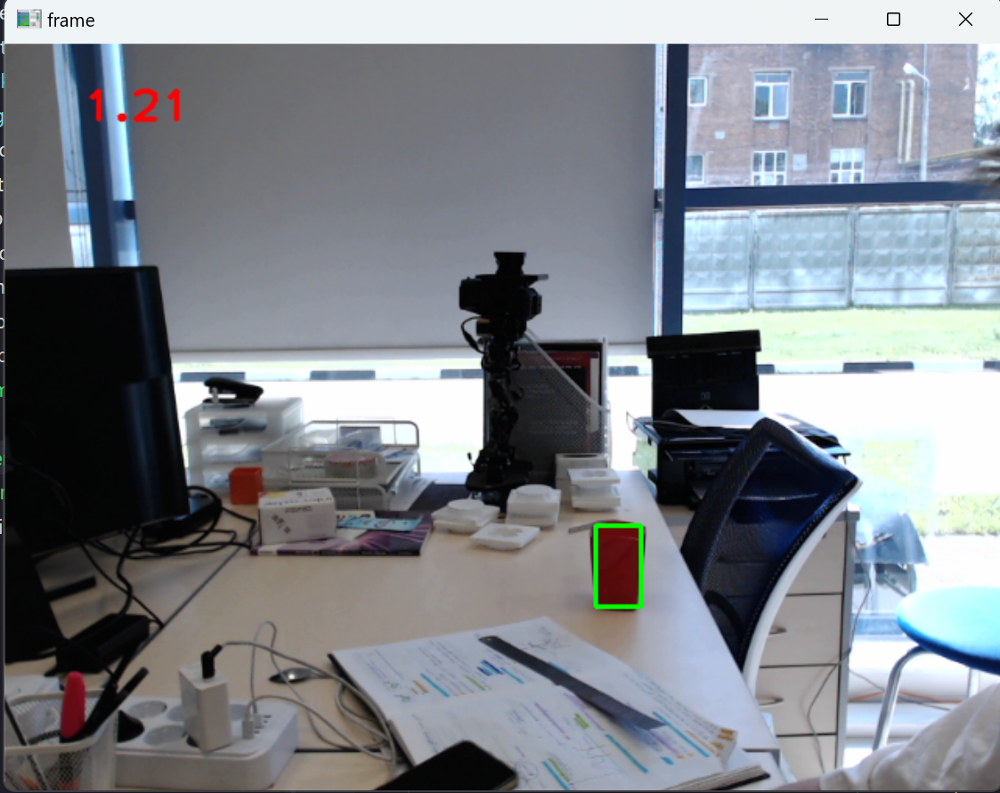

## Pic2r

In [63]:
import numpy as np
import math
import cv2

def pic2r(A, alpha, beta, x, y, h):
    fx = A[0, 0]
    fy = A[1, 1]
    cx = A[0, 2]
    cy = A[1, 2]
    
    y_ = h * math.tan(math.pi / 2 - beta - math.atan((y - cy) / fy))
    x_ = y_ * (x - cx) / fx
    
    R = np.array([[math.cos(alpha), -math.sin(alpha)],
                  [math.sin(alpha), math.cos(alpha)]])
    
    rotated = R @ np.array([x_, y_])
    
    return rotated[0], rotated[1]

A = np.array([[1.41449364e+03, 0.00000000e+00, 9.35626496e+02],
              [0.00000000e+00, 1.40869591e+03, 5.97758496e+02],
              [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

dist = np.array([[0.1230026, -0.24356912, 0.00444053, -0.00125263, 0.08022022]])

cam = cv2.VideoCapture(cv2.CAP_DSHOW)
cam.set(cv2.CAP_PROP_FRAME_WIDTH, 1920)
cam.set(cv2.CAP_PROP_FRAME_HEIGHT, 1080)

x, y = 0, 0

while (True):
    success, frame = cam.read()
    
    blurred = cv2.blur(frame, (7, 7))
    hsv = cv2.cvtColor(blurred, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (0, 190, 125), (240, 255, 255))
    
    cv2.imshow('mask', mask)
    
    connectivity = 4  
    output = cv2.connectedComponentsWithStats(mask, connectivity, cv2.CV_32S)
    
    num_labels = output[0]
    labels = output[1]
    stats = output[2]
    
    obj_h = 0.0000001
    
    for i in range(1, num_labels):
        a = stats[i, cv2.CC_STAT_AREA]
        top = stats[i, cv2.CC_STAT_TOP]
        left = stats[i, cv2.CC_STAT_LEFT]
        width = stats[i, cv2.CC_STAT_WIDTH]
        height = stats[i, cv2.CC_STAT_HEIGHT]
        
        if (a >= 3500):
            cv2.rectangle(frame, (left, top), (left + width, top + height), (0, 255, 0), 2)
            
            x = left + width // 2
            y = top + height
            
            break
    
    xr, yr = pic2r(A, 0, (90 - 77) / 180 * math.pi, x, y, 30)
    
    image = cv2.putText(frame, str(xr)[:5] + " " + str(yr)[:5], (50, 50), cv2.FONT_HERSHEY_PLAIN, 2, (0, 0, 255), 2, cv2.LINE_AA)
            
    
    cv2.imshow('frame', frame)
    
    cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
    cv2.imshow('custom window', frame)
    cv2.resizeWindow('custom window', 1280, 720)
    
    key = cv2.waitKey(90) & 0xFF
    
    if (key == ord('q')):
        break

cam.release()
cv2.destroyAllWindows()
cv2.waitKey(10)



-1

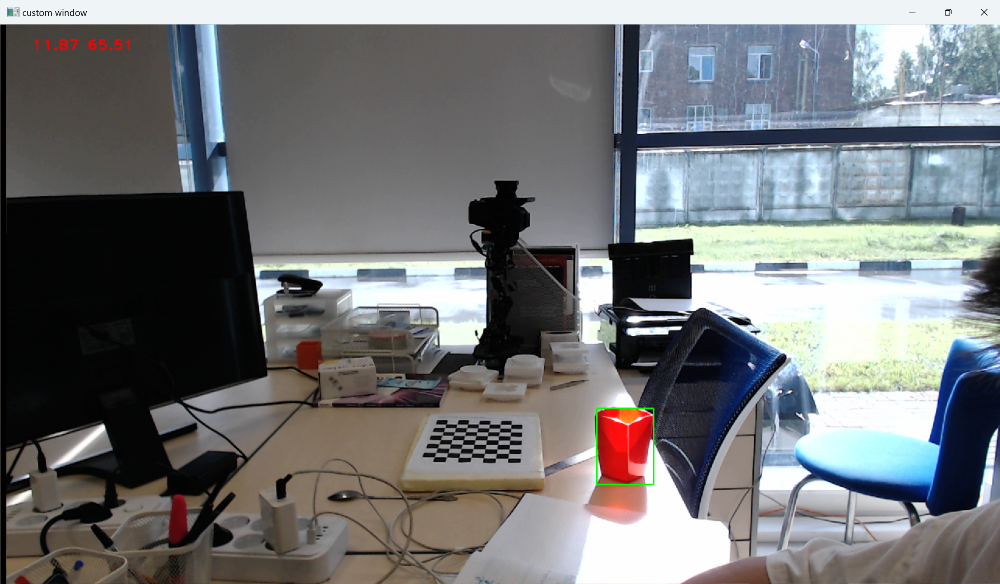